## Interactive Oil Wells Map & Cropland Maps

Oil well density by census tract + crop overlay.

Oil well density by census tract + demographics (population + ag/ worker)

In [3]:
## importing libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import folium
import numpy as np
import seaborn

In [4]:
## Pulling raw Kern County oil well data from group repo
kern_wells = pd.read_csv('https://raw.githubusercontent.com/ybecerra29/up221groupproject/main/kern_county_oil.csv')

In [5]:
kern_wells.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156313 entries, 0 to 156312
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   LeaseName   156313 non-null  object 
 1   WellDesign  156313 non-null  object 
 2   WellStatus  156313 non-null  object 
 3   WellType    156313 non-null  object 
 4   WellTypeLa  156313 non-null  object 
 5   OperatorNa  156313 non-null  object 
 6   Place       156313 non-null  object 
 7   CountyName  156313 non-null  object 
 8   Latitude    156313 non-null  float64
 9   Longitude   156313 non-null  float64
 10  GISSource   156313 non-null  object 
 11  isDirectio  156313 non-null  object 
 12  WellSymbol  156313 non-null  object 
dtypes: float64(2), object(11)
memory usage: 15.5+ MB


In [6]:
kern_wells.head()

,LeaseName,WellDesign,WellStatus,WellType,WellTypeLa,OperatorNa,Place,CountyName,Latitude,Longitude,GISSource,isDirectio,WellSymbol
0,Southern Pacific,Southern Pacific 11H,Canceled,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.401291,-118.860405,Operator,N,CanceledOG
1,Siegfus,Siegfus 31X-22,Canceled,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.397495,-118.855888,Operator,N,CanceledOG
2,Southern Pacific,Southern Pacific 5H,Canceled,OG,Oil & Gas,"Stockdale Oil & Gas, Inc.",Kern County,Kern,35.404583,-118.850471,mip,N,CanceledOG
3,Southern Pacific,Southern Pacific 6H,Canceled,OG,Oil & Gas,"Stockdale Oil & Gas, Inc.",Kern County,Kern,35.403610,-118.849937,mip,N,CanceledOG
4,Southern Pacific,Southern Pacific 7H,Canceled,OG,Oil & Gas,"Stockdale Oil & Gas, Inc.",Kern County,Kern,35.405106,-118.856483,mip,N,CanceledOG


In [7]:
## Examining well type
kern_wells['WellType'].value_counts()

OG       103604
SC        20070
SF        11508
WF         6996
OB         4228
DH         3481
Multi      2046
WD         1602
INJ         929
CH          611
DG          477
UNK         288
WS          141
PM          125
GD          115
AI           64
GAS          18
GS            9
LG            1
Name: WellType, dtype: int64

Based on this [CA Dept of Conservation (DOC) metadata doc](https://www.conservation.ca.gov/calgem/maps/Documents/GIS-metadata-ReadMe.pdf), seems like we might want to sort for OG (Oil and Gas), GAS (Gas Well), LG (Liquid Gas), and DG (Dry Gas)? Or limit to OG since the number of other types, with exception to DG are so small in comparison.

In [8]:
## Examining the status of the wells in the County
kern_wells['WellStatus'].value_counts()

Plugged        71548
Active         46049
Idle           27930
Canceled        8355
New             2251
PluggedOnly      147
Unknown           33
Name: WellStatus, dtype: int64

Again, after consulting [DOC metadata doc](https://www.conservation.ca.gov/calgem/maps/Documents/GIS-metadata-ReadMe.pdf), we should maybe consider at least dropping the "Canceled" wells. All other types, even the "Idle" wells have been drilled and or are capable of operations.

In [9]:
## Subsetting data for Oil and Gas wells
kern_OGwells = kern_wells[kern_wells['WellType'] == 'OG']
kern_OGwells.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103604 entries, 0 to 156312
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   LeaseName   103604 non-null  object 
 1   WellDesign  103604 non-null  object 
 2   WellStatus  103604 non-null  object 
 3   WellType    103604 non-null  object 
 4   WellTypeLa  103604 non-null  object 
 5   OperatorNa  103604 non-null  object 
 6   Place       103604 non-null  object 
 7   CountyName  103604 non-null  object 
 8   Latitude    103604 non-null  float64
 9   Longitude   103604 non-null  float64
 10  GISSource   103604 non-null  object 
 11  isDirectio  103604 non-null  object 
 12  WellSymbol  103604 non-null  object 
dtypes: float64(2), object(11)
memory usage: 11.1+ MB


In [10]:
## Dropping "Canceled" wells from dataset
kern_OGwells = kern_OGwells[kern_OGwells.WellStatus != 'Canceled']

In [11]:
kern_OGwells.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96727 entries, 7 to 156312
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   LeaseName   96727 non-null  object 
 1   WellDesign  96727 non-null  object 
 2   WellStatus  96727 non-null  object 
 3   WellType    96727 non-null  object 
 4   WellTypeLa  96727 non-null  object 
 5   OperatorNa  96727 non-null  object 
 6   Place       96727 non-null  object 
 7   CountyName  96727 non-null  object 
 8   Latitude    96727 non-null  float64
 9   Longitude   96727 non-null  float64
 10  GISSource   96727 non-null  object 
 11  isDirectio  96727 non-null  object 
 12  WellSymbol  96727 non-null  object 
dtypes: float64(2), object(11)
memory usage: 10.3+ MB


In [12]:
kern_OGwells.head()

,LeaseName,WellDesign,WellStatus,WellType,WellTypeLa,OperatorNa,Place,CountyName,Latitude,Longitude,GISSource,isDirectio,WellSymbol
7,Southern Pacific,Southern Pacific 10H,Idle,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.402748,-118.857201,GPS,N,IdleOG
8,Siegfus,Siegfus 122,Idle,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.397060,-118.860001,GPS,N,IdleOG
9,Siegfus,Siegfus 1H,Idle,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.393887,-118.860725,GPS,N,IdleOG
10,Siegfus,Siegfus 2122,Idle,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.397015,-118.858070,GPS,N,IdleOG
11,Siegfus,Siegfus 222,Idle,OG,Oil & Gas,California Resources Production Corporation,Kern County,Kern,35.395214,-118.860275,GPS,N,IdleOG


In [13]:
## Trimming columns
kern_OGwells = kern_OGwells[['OperatorNa', 'WellStatus','WellType','Latitude','Longitude']]
kern_OGwells.sample()

,OperatorNa,WellStatus,WellType,Latitude,Longitude
30930,Aera Energy LLC,Plugged,OG,35.457485,-119.720871


In [14]:
## Renaming columns
kern_OGwells.columns = ['Operator', 'WellStatus','WellType','Latitude','Longitude']
kern_OGwells.sample()

,Operator,WellStatus,WellType,Latitude,Longitude
130174,Chevron U.S.A. Inc.,Plugged,OG,35.265533,-119.587723


In [15]:
## seeing the status OG wells
kern_OGwells['WellStatus'].value_counts()

Plugged        55058
Active         23491
Idle           16718
New             1337
PluggedOnly      102
Unknown           21
Name: WellStatus, dtype: int64

There seem to be more "Plugged" than "Active" wells -- which, according to the [DOC](https://www.conservation.ca.gov/calgem/maps/Documents/GIS-metadata-ReadMe.pdf), " represents plugged and abandoned wells that are permanently sealed."

Now to convert data into geodata for a map.

In [16]:
## converting df into gdf
kern_wellsgeo = gpd.GeoDataFrame(kern_OGwells, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(kern_OGwells.Longitude, kern_OGwells.Latitude))

In [17]:
## checking projection
kern_wellsgeo.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

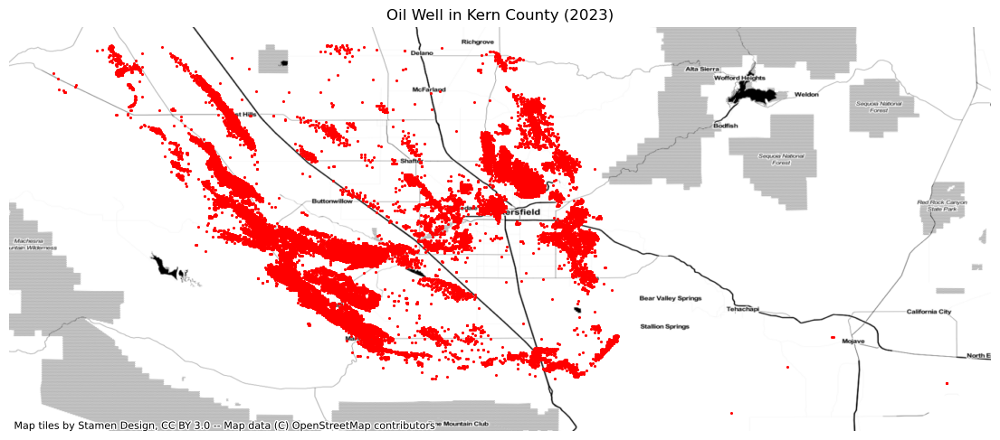

In [18]:
## static map w/ oil gas locations
fig, ax = plt.subplots(figsize=(14,12))

kern_wellsgeo.plot(ax=ax, 
        marker='.',
        markersize=6,
        color='red')

ax.axis('off')
ax.set_title('Oil Well in Kern County (2023)')
ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=4326)

Let's see how oil wells are distributed by status.

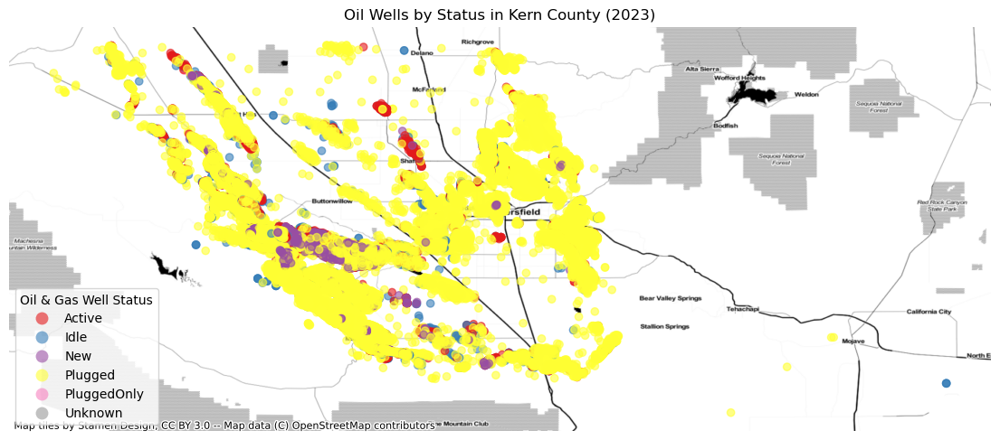

In [19]:
## static map: oil well locations by status

fig, ax = plt.subplots(figsize=(14,12))

kern_wellsgeo.plot(ax=ax,
                   column='WellStatus',
                   legend=True,cmap='Set1',
                   legend_kwds={'loc': 'lower left'},
                   alpha=.6)

ax.axis('off')
ax.set_title('Oil Wells by Status in Kern County (2023)')
ax.get_legend().set_title("Oil & Gas Well Status")
ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=4326)

Need to merge with CalEnviroScreen Data for census tract boundaries and to see if comparison with other health impacts can be made.

In [20]:
## Opening CalEnviroScreen 4.0 data downloaded from the CalEnviroScreen website
CESdata = gpd.read_file('calenviroscreen40shpf2021shp.zip')

In [21]:
CESdata.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8035 entries, 0 to 8034
Data columns (total 67 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Tract       8035 non-null   float64 
 1   ZIP         8035 non-null   int64   
 2   County      8035 non-null   object  
 3   ApproxLoc   8035 non-null   object  
 4   TotPop19    8035 non-null   int64   
 5   CIscore     8035 non-null   float64 
 6   CIscoreP    8035 non-null   float64 
 7   Ozone       8035 non-null   float64 
 8   OzoneP      8035 non-null   float64 
 9   PM2_5       8035 non-null   float64 
 10  PM2_5_P     8035 non-null   float64 
 11  DieselPM    8035 non-null   float64 
 12  DieselPM_P  8035 non-null   float64 
 13  Pesticide   8035 non-null   float64 
 14  PesticideP  8035 non-null   float64 
 15  Tox_Rel     8035 non-null   float64 
 16  Tox_Rel_P   8035 non-null   float64 
 17  Traffic     8035 non-null   float64 
 18  TrafficP    8035 non-null   float64 
 19

In [22]:
## "Tract" is still a float; converting to a string
CESdata['Tract'] = CESdata['Tract'].astype(np.str)
CESdata['Tract'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 8035 entries, 0 to 8034
Series name: Tract
Non-Null Count  Dtype 
--------------  ----- 
8035 non-null   object
dtypes: object(1)
memory usage: 62.9+ KB


/tmp/ipykernel_14616/2642479184.py:2: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  CESdata['Tract'] = CESdata['Tract'].astype(np.str)


In [23]:
## Creating a FIPS column
CESdata['FIPS'] = '0'+CESdata['Tract']
CESdata.sample()

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,FIPS
4217,6065041101.0,92503,Riverside,Riverside,6247,54.614106,92.221382,0.064647,93.627878,12.931684,...,90.9877,7.6997,0.9284,0.0,0.3842,5914.148152,1.574841e+06,0.0,"POLYGON ((235354.275 -449019.462, 235367.956 -...",06065041101.0


In [24]:
## confirming that Kern's 151 census tracts are here
CESdata['County'].value_counts()

Los Angeles        2343
San Diego           627
Orange              582
Riverside           453
Santa Clara         372
San Bernardino      369
Alameda             360
Sacramento          317
Contra Costa        207
Fresno              199
San Francisco       195
Ventura             173
San Mateo           157
Kern                151
San Joaquin         139
Sonoma               99
Solano               96
Stanislaus           94
Monterey             93
Santa Barbara        89
Placer               84
Tulare               78
Marin                55
San Luis Obispo      53
Santa Cruz           52
Butte                51
Merced               49
Shasta               48
El Dorado            42
Yolo                 41
Napa                 40
Imperial             31
Humboldt             30
Kings                27
Madera               23
Sutter               21
Mendocino            20
Nevada               20
Lake                 15
Yuba                 14
Siskiyou             14
San Benito      

In [25]:
## Subsetting for Kern County
Kern_env = CESdata[CESdata.County == 'Kern']
Kern_env.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 151 entries, 1402 to 1552
Data columns (total 68 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Tract       151 non-null    object  
 1   ZIP         151 non-null    int64   
 2   County      151 non-null    object  
 3   ApproxLoc   151 non-null    object  
 4   TotPop19    151 non-null    int64   
 5   CIscore     151 non-null    float64 
 6   CIscoreP    151 non-null    float64 
 7   Ozone       151 non-null    float64 
 8   OzoneP      151 non-null    float64 
 9   PM2_5       151 non-null    float64 
 10  PM2_5_P     151 non-null    float64 
 11  DieselPM    151 non-null    float64 
 12  DieselPM_P  151 non-null    float64 
 13  Pesticide   151 non-null    float64 
 14  PesticideP  151 non-null    float64 
 15  Tox_Rel     151 non-null    float64 
 16  Tox_Rel_P   151 non-null    float64 
 17  Traffic     151 non-null    float64 
 18  TrafficP    151 non-null    float64 
 

In [26]:
Kern_env.sample(3)

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,FIPS
1495,6029006304.0,93203,Kern,Arvin,4395,49.172485,86.964196,0.064647,93.627878,11.605964,...,97.6337,1.8430,0.1365,0.0000,0.2730,8137.874597,3.964969e+06,0.1138,"POLYGON ((108628.021 -312893.232, 106174.644 -...",06029006304.0
1532,6029001202.0,93305,Kern,East Bakersfield,6049,48.953376,86.661624,0.064647,93.627878,15.677903,...,77.8310,10.8613,10.2662,0.5125,0.5290,6111.437983,1.485466e+06,0.0000,"POLYGON ((93724.697 -292882.689, 93727.689 -29...",06029001202.0
1476,6029006500.0,93505,Kern,California City,4501,41.235726,76.979324,0.059485,80.087119,6.650927,...,43.8569,32.3484,15.0633,0.2000,3.3992,350262.972481,2.034120e+09,5.1321,"POLYGON ((203913.707 -279851.408, 203807.518 -...",06029006500.0


In [27]:
## Subsetting for variables of interest
Kern_env = Kern_env[['TotPop19', 'ApproxLoc','Tract','FIPS','Pesticide','PesticideP','Asthma','AsthmaP','Cardiovas','CardiovasP','LowBirtWt','LowBirWP','Shape_Leng','Shape_Area','geometry']]
Kern_env.head()

,TotPop19,ApproxLoc,Tract,FIPS,Pesticide,PesticideP,Asthma,AsthmaP,Cardiovas,CardiovasP,LowBirtWt,LowBirWP,Shape_Leng,Shape_Area,geometry
1402,5613,Bakersfield,6029001802.0,06029001802.0,0.000000,0.000000,81.79,86.453141,17.62,79.150050,5.42,62.612266,12653.176612,4.995807e+06,"POLYGON ((85530.318 -294415.802, 85381.055 -29..."
1403,2923,Bakersfield,6029006201.0,06029006201.0,4226.058342,96.206897,77.48,83.599202,21.69,92.883848,7.77,95.432384,68740.430761,8.921771e+07,"POLYGON ((101858.136 -298451.555, 101945.102 -..."
1404,1963,Shafter,6029003900.0,06029003900.0,2961.322941,95.034483,63.74,73.005982,18.51,82.739282,-999.00,-999.000000,76205.507941,2.199447e+08,"POLYGON ((77627.294 -272886.143, 77777.009 -27..."
1405,3739,Bakersfield,6029001700.0,06029001700.0,0.000000,0.000000,155.81,99.165005,21.11,90.839980,6.83,88.093405,8691.608218,3.686952e+06,"POLYGON ((88522.915 -292249.021, 88531.488 -29..."
1406,4300,Oildale,6029000400.0,06029000400.0,0.000000,0.000000,74.68,81.829511,19.40,85.568295,6.65,85.771106,11642.813435,3.167584e+06,"POLYGON ((86144.456 -288916.148, 86197.300 -28..."


In [28]:
Kern_env.crs 

<Derived Projected CRS: EPSG:3310>
Name: NAD83 / California Albers
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: United States (USA) - California.
- bounds: (-124.45, 32.53, -114.12, 42.01)
Coordinate Operation:
- name: California Albers
- method: Albers Equal Area
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [29]:
## error message about gdf mismatch, so changing projection 
Kern_env = Kern_env.to_crs("EPSG:4326") 

<AxesSubplot: >

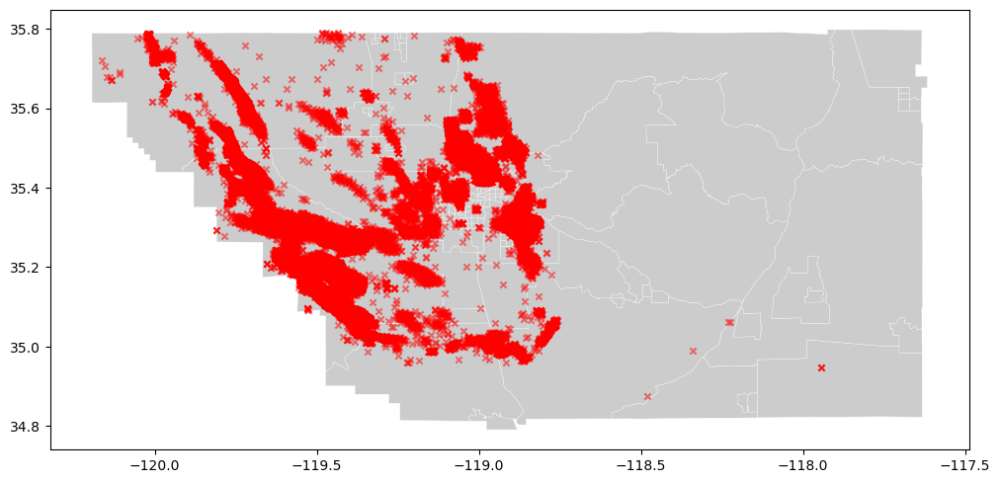

In [30]:
## checking alignment of gdfs
fig,ax = plt.subplots(figsize=(12,10))
Kern_env.plot(ax=ax,facecolor='#ccc',edgecolor='white',lw=0.2)
kern_wellsgeo.plot(ax=ax,color='red',markersize=20,marker='x',alpha=0.5)

In [32]:
print(Kern_env.shape)
print(kern_wellsgeo.shape)

(151, 15)
(96727, 6)


In [33]:
## merging
kern_wells_env = gpd.sjoin(kern_wellsgeo, Kern_env,how="left")
kern_wells_env.shape

(96727, 21)

No new rows or columns -- good.

In [34]:
## creating new df assigning wells to tracts
wellsdensity = kern_wells_env.value_counts('Tract').reset_index(name='Count')
wellsdensity.head(10)

,Tract,Count
0,6029003304.0,50126
1,6029004500.0,11250
2,6029003303.0,11182
3,6029005103.0,11038
4,6029005201.0,3109
5,6029003306.0,1434
6,6029006202.0,1396
7,6029006007.0,1072
8,6029003900.0,807
9,6029001000.0,744


In [35]:
## joinin/merging density df to CES4 gdf
kern_wells_env = Kern_env.merge(wellsdensity, how='left', on='Tract')
kern_wells_env.sample(3)

,TotPop19,ApproxLoc,Tract,FIPS,Pesticide,PesticideP,Asthma,AsthmaP,Cardiovas,CardiovasP,LowBirtWt,LowBirWP,Shape_Leng,Shape_Area,geometry,Count
99,8948,Unincorporated Kern County area,6029004301.0,06029004301.0,3289.493136,95.551724,42.32,45.114656,21.22,91.550349,6.44,82.755966,57782.148264,9.591560e+07,"POLYGON ((-119.27677 35.61626, -119.27690 35.6...",8.0
16,7970,Bakersfield,6029003122.0,06029003122.0,0.030548,17.965517,78.11,84.322034,21.13,90.964606,5.88,72.850911,6528.496569,2.663460e+06,"POLYGON ((-119.00306 35.29589, -119.02123 35.2...",NaN
126,10772,Bakersfield,6029002301.0,06029002301.0,1.336953,44.620690,84.71,87.500000,23.51,95.987039,6.18,78.650244,12598.101095,6.681875e+06,"POLYGON ((-118.91424 35.35830, -118.91418 35.3...",1.0


In [36]:
## Seeing some 'NaN' - probably where there are no wells
## changing values for tracts with no wells to 0
kern_wells_env['Count'] = kern_wells_env['Count'].fillna(0)

In [37]:
kern_wells_env.sample(3)

,TotPop19,ApproxLoc,Tract,FIPS,Pesticide,PesticideP,Asthma,AsthmaP,Cardiovas,CardiovasP,LowBirtWt,LowBirWP,Shape_Leng,Shape_Area,geometry,Count
92,6011,Bear Valley Springs,6029006008.0,06029006008.0,240.872816,81.551724,51.89,58.860917,16.83,75.311565,2.55,4.926867,85801.655848,2.716953e+08,"POLYGON ((-118.69604 35.26828, -118.69383 35.2...",0.0
75,10285,Bakersfield,6029003205.0,06029003205.0,0.000000,0.000000,56.78,65.092223,19.05,84.421735,4.39,35.604311,8314.437648,4.063803e+06,"POLYGON ((-119.02689 35.28143, -119.05667 35.2...",1.0
10,6015,Unincorporated Kern County area,6029005501.0,06029005501.0,1.289928,44.379310,71.18,79.125125,23.70,96.398305,6.09,77.046446,155386.696062,7.181488e+08,"POLYGON ((-117.84875 35.79569, -117.84878 35.7...",0.0


In [38]:
# reprojecting to mercator
kern_wells_env_mercator=kern_wells_env.to_crs(3857)
Kern_env_mercator=Kern_env.to_crs(3857)

In [39]:
kern_wells_env_mercator.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 151 entries, 0 to 150
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   TotPop19    151 non-null    int64   
 1   ApproxLoc   151 non-null    object  
 2   Tract       151 non-null    object  
 3   FIPS        151 non-null    object  
 4   Pesticide   151 non-null    float64 
 5   PesticideP  151 non-null    float64 
 6   Asthma      151 non-null    float64 
 7   AsthmaP     151 non-null    float64 
 8   Cardiovas   151 non-null    float64 
 9   CardiovasP  151 non-null    float64 
 10  LowBirtWt   151 non-null    float64 
 11  LowBirWP    151 non-null    float64 
 12  Shape_Leng  151 non-null    float64 
 13  Shape_Area  151 non-null    float64 
 14  geometry    151 non-null    geometry
 15  Count       151 non-null    float64 
dtypes: float64(11), geometry(1), int64(1), object(3)
memory usage: 20.1+ KB


In [40]:
## changing count to integer
kern_wells_env_mercator['Count'] = kern_wells_env_mercator['Count'].astype(int)
kern_wells_env_mercator['Count'].info()

<class 'pandas.core.series.Series'>
Int64Index: 151 entries, 0 to 150
Series name: Count
Non-Null Count  Dtype
--------------  -----
151 non-null    int64
dtypes: int64(1)
memory usage: 2.4 KB


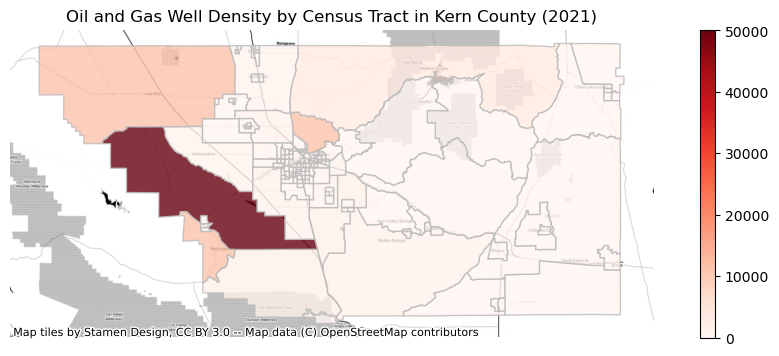

In [41]:
## Static map of well density
fig,ax = plt.subplots(figsize=(12,4))
kern_wells_env_mercator.plot(ax=ax,
                        column='Count',
                        edgecolor='#bbb',  
                        cmap='Reds', 
                        alpha=0.8,
                        legend=True)
ax.axis('off')
ax.set_title('Oil and Gas Well Density by Census Tract in Kern County (2021)')
ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=3857)

Mapping population density using CES4 data.

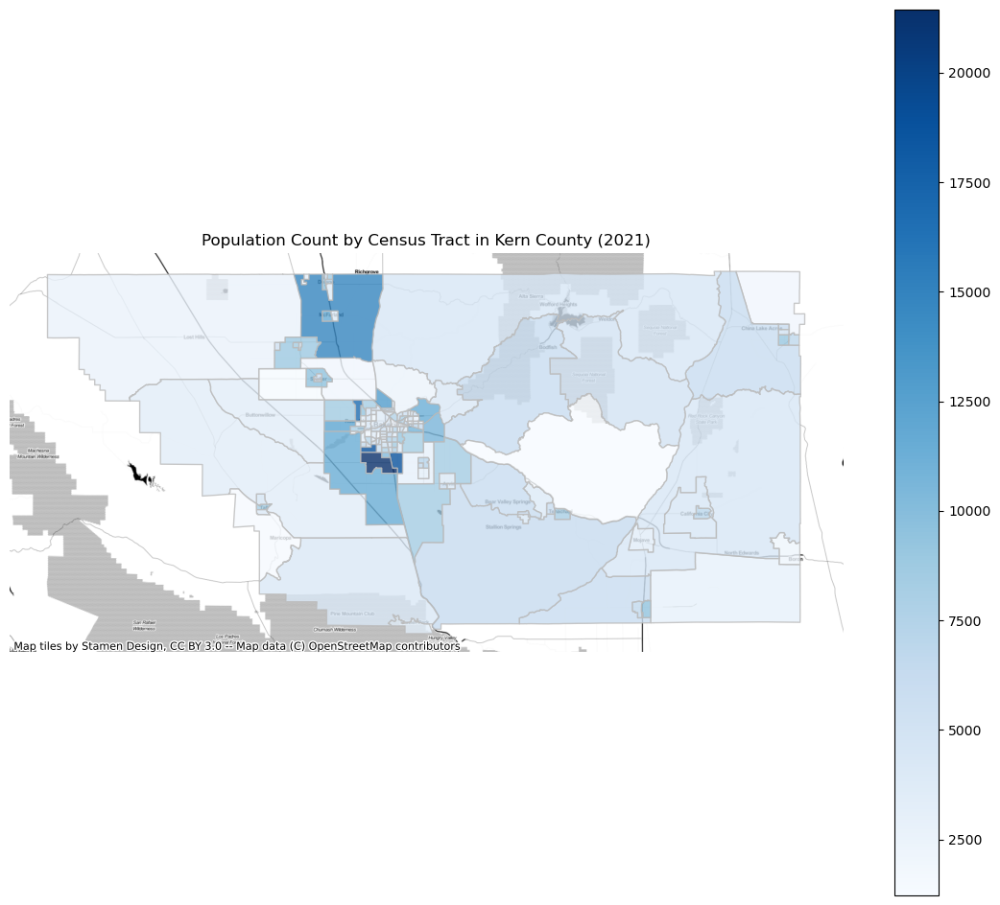

In [42]:
## Mapping population counts
fig,ax = plt.subplots(figsize=(14,12))

kern_wells_env_mercator.plot(ax=ax,
                        column='TotPop19',
                        edgecolor='#bbb',  
                        cmap='Blues', 
                        alpha=0.8,
                        legend=True)

ax.axis('off')
ax.set_title('Population Count by Census Tract in Kern County (2021)')
ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=3857)

Mapping low birth weight using CES4 data.

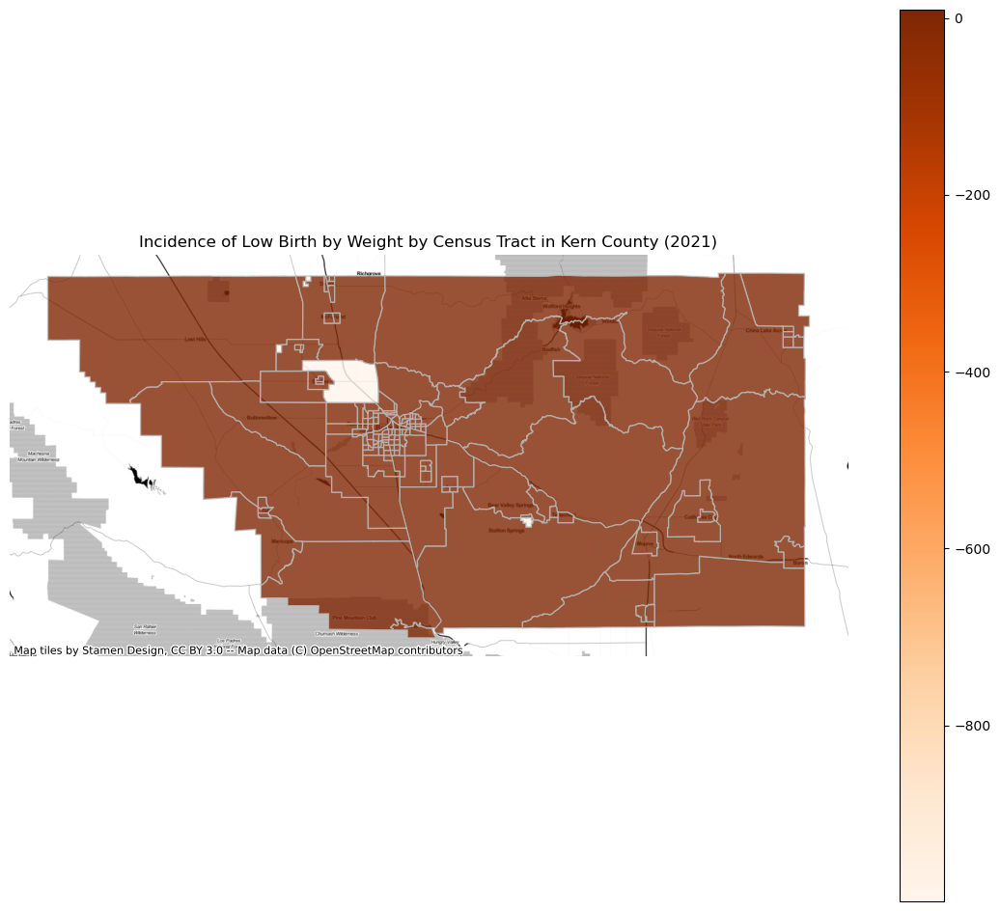

In [43]:
## Mapping indicence of low birth weights
fig,ax = plt.subplots(figsize=(14,12))

kern_wells_env_mercator.plot(ax=ax,
                        column='LowBirtWt',
                        edgecolor='#bbb',  
                        cmap='Oranges', 
                        alpha=0.8,
                        legend=True)

ax.axis('off')
ax.set_title('Incidence of Low Birth by Weight by Census Tract in Kern County (2021)')
ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=3857)

In [44]:
print(kern_wells_env_mercator['LowBirtWt'].min())
print(kern_wells_env_mercator['LowBirtWt'].max())

-999.0
9.35


In [45]:
## Seems like there are some missing values; finding missing values across columns
print(kern_wells_env_mercator['LowBirtWt'].value_counts()[-999.0]) ## 5 "missing" values to note for later

5


In [46]:
kern_wells_env_mercator['LowBirtWt'].info()

<class 'pandas.core.series.Series'>
Int64Index: 151 entries, 0 to 150
Series name: LowBirtWt
Non-Null Count  Dtype  
--------------  -----  
151 non-null    float64
dtypes: float64(1)
memory usage: 2.4 KB


Low birth weight incidence has a really narrow range that's not captured here, probably because of the "-999" values that are messing with the scale. Need to customize a scale for this indicator. Can't drop them, but also can't recode these values into a NA w/o changing the datatype and making it unplottable...

In [47]:
## Identifying % values for 25% and 75% quartiles
kern_wells_env_mercator['LowBirtWt'].quantile([0.25,0.5,0.75])

0.25    4.175
0.50    5.380
0.75    6.390
Name: LowBirtWt, dtype: float64

In [48]:
## rescaling
kern_wells_env_mercator['LowBirthWeightScale'] = '3: High - More than 6.4% of live births'
kern_wells_env_mercator.loc[kern_wells_env_mercator['LowBirtWt'] <6.4, 'LowBirthWeightScale'] = '2: Moderate - 4.2% to 6.4% of live births'
kern_wells_env_mercator.loc[kern_wells_env_mercator['LowBirtWt'] <4.2, 'LowBirthWeightScale'] = '1: Low - Less than 4.2% of live births'
kern_wells_env_mercator['LowBirthWeightScale'].sample(3)

121      3: High - More than 6.4% of live births
39        1: Low - Less than 4.2% of live births
146    2: Moderate - 4.2% to 6.4% of live births
Name: LowBirthWeightScale, dtype: object

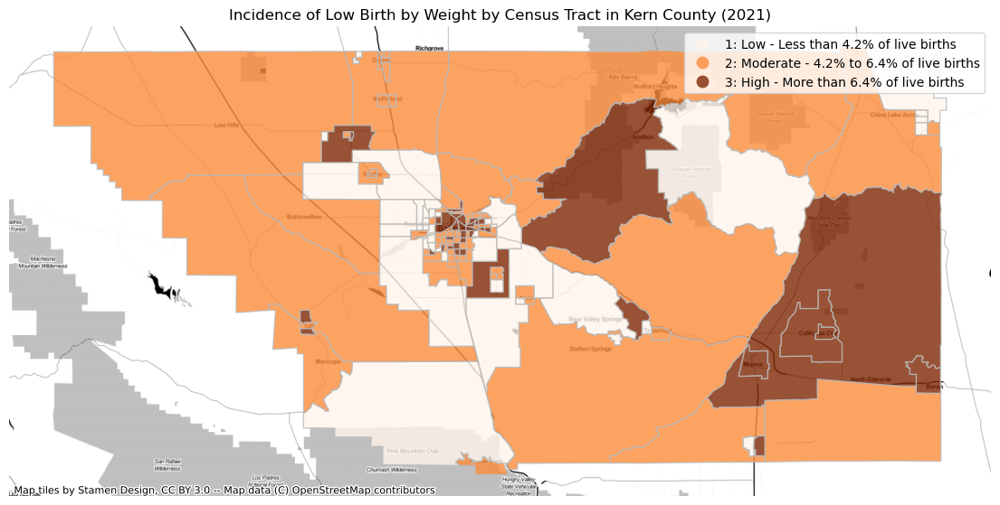

In [49]:
## Mapping indicence of low birth weights
fig,ax = plt.subplots(figsize=(14,12))

kern_wells_env_mercator.plot(ax=ax,
                        column='LowBirthWeightScale',
                        edgecolor='#bbb',  
                        cmap='Oranges',
                        alpha=0.8,
                        legend=True)

ax.axis('off')
ax.set_title('Incidence of Low Birth by Weight by Census Tract in Kern County (2021)')
ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=3857)

Recreating to match the aesthetics for presentation.

The "big show": overlaying these maps onto an interactive map.

In [52]:
## centering Kern County: 35.4937° N, 118.8597° W
Kern = folium.Map(location=[35.4,-118.8], 
               zoom_start = 8,
               tiles='CartoDB positron', 
               attribution='CartoDB')

## First layer: OG wells
folium.Choropleth(
                  geo_data=kern_wells_env_mercator, 
                  data=kern_wells_env_mercator,         
                  key_on='feature.properties.FIPS', 
                  columns=['FIPS', 'Count'], 
                  fill_color='Reds',
                  nan_fill_color='lightgray',
                  line_color='#bbb',
                  line_weight=0.8, 
                  fill_opacity=0.8,
                  line_opacity=0.2, 
                  legend_name='Oil & Gas Wells and Health Outcomes in Kern County').add_to(Kern)
Kern

In [53]:
## adding tooltips to OG wells layer
folium.features.GeoJson(
                    data=kern_wells_env_mercator,
                    name='Oil & Gas Well Locations (2023)',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['Count',
                                'FIPS'
                               ],
                        aliases=["Number of Oil & Gas Well Structures:",
                                 "Census Tract ID:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Kern) 
Kern

In [54]:
## Creating "toggle-able" layers
Kern = folium.Map(location=[35.4,-118.8], 
               zoom_start = 8,
               tiles=None,
               overlay=False)

## FAILING to add a poor man's title, code works but image is not showing up properly
## from folium.plugins import FloatImage
## image_file ='Kern Map Title_small.png'
## FloatImage(image_file, bottom=86, left=10).add_to(Kern)

fg1 = folium.FeatureGroup(name='Density of Oil & Gas Well Locations',overlay=False).add_to(Kern)
fg2 = folium.FeatureGroup(name='Population Count',overlay=False).add_to(Kern)
fg3 = folium.FeatureGroup(name='Incidence of Low Birth Weight',overlay=False).add_to(Kern)
fg4 = folium.FeatureGroup(name='Asthma Rate per 10K residents',overlay=False).add_to(Kern)
fg5 = folium.FeatureGroup(name='Cardiovascular Disease Rate per 10K residents',overlay=False).add_to(Kern)

In [55]:
## adding OG wells layer
custom_scale1 = (kern_wells_env_mercator['Count'].quantile((0,0.3,0.75,0.95,0.999,1))).tolist()
OGwells=folium.Choropleth(
            geo_data=kern_wells_env_mercator,
            data=kern_wells_env_mercator,
            columns=['FIPS', 'Count'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale1,
            fill_color='YlOrRd',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend_name='Oil & Gas Well Density',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg1)

## Adding tooltips
folium.features.GeoJson(
                    data=kern_wells_env_mercator,
                    name='Oil & Gas Well Locations in Kern County (2023)',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'Count'
                               ],
                        aliases=["Tract:",
                                 "Oil & Gas Wells:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(OGwells) 

In [56]:
## reminder: include "ApproxLoc" as city in the tooltips
## adding OG wells layer
custom_scale2 = (kern_wells_env_mercator['TotPop19'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Population=folium.Choropleth(
            geo_data=kern_wells_env_mercator,
            data=kern_wells_env_mercator,
            columns=['FIPS','TotPop19'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale2,
            fill_color='Blues',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend_name='Population Count',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg2)

## Adding tooltips
folium.features.GeoJson(
                    data=kern_wells_env_mercator,
                    name='Number of Residents by Census Tract in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'TotPop19',
                                'ApproxLoc'
                               ],
                        aliases=["Tract:",
                                 "Residents:",
                                 "City/Area:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Population) 

In [57]:
## low birthweight layer
## 'LowBirtWt' or 'LowBirthWeightScale'
custom_scale3 = (kern_wells_env_mercator['LowBirtWt'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Lowbirthweight=folium.Choropleth(
            geo_data=kern_wells_env_mercator,
            data=kern_wells_env_mercator,
            columns=['FIPS','LowBirtWt'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale3,
            fill_color='Oranges',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend_name='Population Count',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg3)

## Adding tooltips
folium.features.GeoJson(
                    data=kern_wells_env_mercator,
                    name='Incidence of Low Birth Weight in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'LowBirtWt'
                               ],
                        aliases=["Tract:",
                                 "Percentage of Births:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Lowbirthweight) 

In [58]:
## Asthma layer
custom_scale4 = (kern_wells_env_mercator['Asthma'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Asthma=folium.Choropleth(
            geo_data=kern_wells_env_mercator,
            data=kern_wells_env_mercator,
            columns=['FIPS','Asthma'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale4,
            fill_color='Oranges',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend_name='Rates of Asthma',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg4)

## Adding tooltips
folium.features.GeoJson(
                    data=kern_wells_env_mercator,
                    name='Rates of Asthma per 10,000 residents in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'Asthma'
                               ],
                        aliases=["Tract:",
                                 "Asthma Rate:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Asthma) 

In [59]:
## Cardio disease layer
custom_scale5 = (kern_wells_env_mercator['Cardiovas'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
Cardio=folium.Choropleth(
            geo_data=kern_wells_env_mercator,
            data=kern_wells_env_mercator,
            columns=['FIPS','Cardiovas'],  
            key_on='feature.properties.FIPS', 
            threshold_scale=custom_scale5,
            fill_color='Oranges',
            nan_fill_color='lightgray',
            fill_opacity=0.5,
            line_opacity=0.2,
            legend_name='Rates of Cardiovascular Disease',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg5)

## Adding tooltips
folium.features.GeoJson(
                    data=kern_wells_env_mercator,
                    name='Rates of Cardiovascular Disease per 10,000 residents in Kern County',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['FIPS',
                                'Cardiovas'
                               ],
                        aliases=["Tract:",
                                 "Cardiovascular Disease Rate:"
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(Cardio) 

In [60]:
## Adding layer control
# folium.TileLayer('Stamen Toner',overlay=True).add_to(Kern)
folium.TileLayer('cartodbpositron',overlay=True).add_to(Kern)
folium.LayerControl(collapsed=False).add_to(Kern)
Kern

In [65]:
## Saving
Kern.save("OilgaswellsandhealthKern.html")

## Exploring Cropland in Kern County

Now to explore where and the kind of crops are being grown in the county, so we can begin to compare concentrations of cropland and oil and gas wells.

In [62]:
crops = gpd.read_file('kern2022.zip')

In [63]:
crops.shape

(12178, 22)

In [64]:
crops.head()

,DT_ACT,P_STATUS,PERMIT,SITEID,S_STATUS,DT_INACT,PMT_SITE,OP_ACT,OP_INACT,PERMITTEE,...,TOWNSHIP,RANGE,PMT_YEAR,COMM,ACRES,SECTION,CITY,AGENT,ZIP,geometry
0,2022-01-01,A,1502038,1315A,A,None,15020381315A,765,None,TEJON RANCH/LAVAL FARMS,...,10N,19W,2022,UNCULTIVATED AG,15.88,15,LEBEC,"MUNOZ/ARMSTRONG,EFREN/MATTHEW",93243,"POLYGON ((6295727.481 2170443.201, 6294851.183..."
1,2022-01-01,A,1502038,1316A,A,None,15020381316A,765,None,TEJON RANCH/LAVAL FARMS,...,10N,19W,2022,UNCULTIVATED AG,40.12,15,LEBEC,"MUNOZ/ARMSTRONG,EFREN/MATTHEW",93243,"POLYGON ((6297283.102 2171251.194, 6297287.236..."
2,2022-01-01,A,1502038,1316B,A,None,15020381316B,765,None,TEJON RANCH/LAVAL FARMS,...,10N,19W,2022,UNCULTIVATED AG,7.32,10,LEBEC,"MUNOZ/ARMSTRONG,EFREN/MATTHEW",93243,"POLYGON ((6297283.102 2171251.194, 6296516.327..."
3,2022-01-01,A,1502038,1318,A,None,15020381318,765,None,TEJON RANCH/LAVAL FARMS,...,10N,19W,2022,ALMOND,84.00,3,LEBEC,"MUNOZ/ARMSTRONG,EFREN/MATTHEW",93243,"POLYGON ((6297314.368 2179098.040, 6297140.186..."
4,2022-01-01,A,1502038,1319,A,None,15020381319,765,None,TEJON RANCH/LAVAL FARMS,...,10N,19W,2022,ALMOND,167.00,3,LEBEC,"MUNOZ/ARMSTRONG,EFREN/MATTHEW",93243,"POLYGON ((6292183.454 2181829.085, 6293212.726..."


In [66]:
crops.columns.to_list()

['DT_ACT',
 'P_STATUS',
 'PERMIT',
 'SITEID',
 'S_STATUS',
 'DT_INACT',
 'PMT_SITE',
 'OP_ACT',
 'OP_INACT',
 'PERMITTEE',
 'MAILING',
 'STATE',
 'TOWNSHIP',
 'RANGE',
 'PMT_YEAR',
 'COMM',
 'ACRES',
 'SECTION',
 'CITY',
 'AGENT',
 'ZIP',
 'geometry']

After reviewing the data, the columns I want to keep include PERMITTEE (Who owns the crop parcel), COMM (what the crop is), ACRES, CITY, and geometry.

In [67]:
## trimming data for desired columns
crops = crops[['PERMITTEE', 'COMM','ACRES','CITY','geometry']]
crops.sample()

,PERMITTEE,COMM,ACRES,CITY,geometry
4380,MAPLE DAIRY,CORN FOR/FOD,74.27,BAKERSFIELD,"POLYGON ((6200692.765 2256538.339, 6200730.668..."


In [68]:
## renaming
crops.columns = ['Owner', 'Crop','Acres','City','geometry']
crops.sample()

,Owner,Crop,Acres,City,geometry
2530,"ILLUME AGRICULTURE, LLC",ALMOND,38.0,BAKERSFIELD,"POLYGON ((6158976.264 2459466.052, 6160311.875..."


In [69]:
## exploring crops grown in the county
crops['Crop'].value_counts()

ALMOND             2636
PISTACHIO          1502
GRAPE              1216
UNCULTIVATED AG     969
ORANGE              673
                   ... 
STRAWBERRY            1
RAPE                  1
OT-PALM               1
MELON-ORGANIC         1
CORN, GRAIN           1
Name: Crop, Length: 183, dtype: int64

In [70]:
## turning "Crop" data into table by type
crop_counts = crops.value_counts(['Crop']).reset_index(name="Count")
crop_counts

,Crop,Count
0,ALMOND,2636
1,PISTACHIO,1502
2,GRAPE,1216
3,UNCULTIVATED AG,969
4,ORANGE,673
...,...,...
178,PUMPKIN,1
179,RADISH-ORGANIC,1
180,RAPE,1
181,RAPE (LEAFY VEG,1


Now to visually quantify what's grown. 

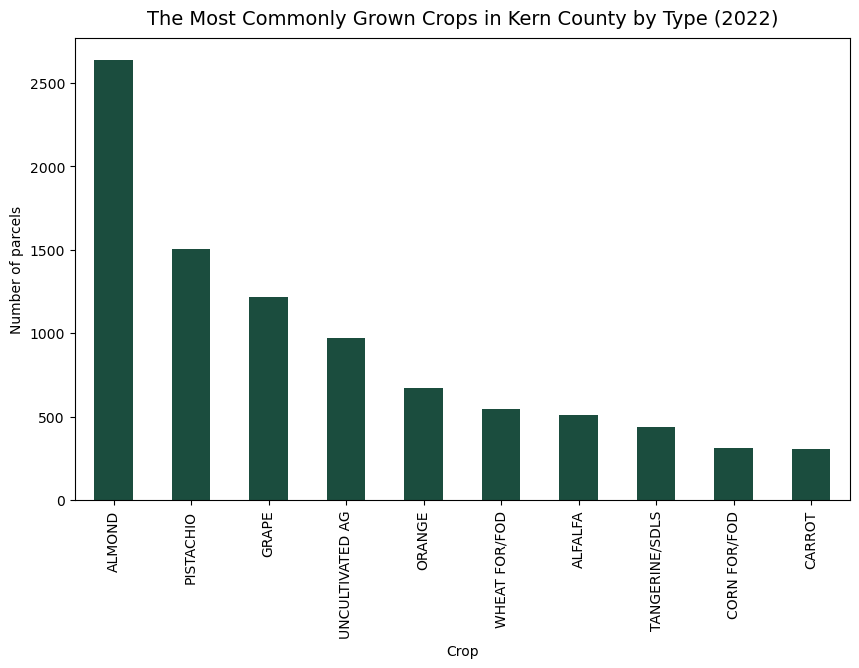

In [71]:
## There are 182 crop types; plotting the 15 most commonly grown crops in the county by type
fig, ax = plt.subplots(figsize=(10,6))

crop_counts[:10].plot.bar(ax=ax,
                                      x='Crop',
                                      y='Count',
                                      legend=False,
                                      color='#1b4d3e'
                                      )
ax.set_xlabel('Crop')
ax.set_ylabel('Number of parcels')
ax.set_title("The Most Commonly Grown Crops in Kern County by Type (2022)",fontsize=14,pad=10)
plt.savefig("KernCommonCropsbyType.jpg")

What if we looked at crops grown by acreage instead?

In [72]:
## creating table summing acreage by crop type
#crop_counts
croparea = crops.groupby('Crop')['Acres'].sum().reset_index(name='Acreage')
croparea

,Crop,Acreage
0,ALFALFA,33341.05
1,ALFALFA-ORGANIC,145.00
2,ALMOND,226840.21
3,ALMOND-ORGANIC,3932.54
4,APPLE,434.50
...,...,...
178,WATERMELON-ORGANIC,299.00
179,WHEAT,11734.40
180,WHEAT FOR/FOD,37991.78
181,WHEAT-ORGANIC,497.40


In [73]:
## sorting values by acreage so table shows crops by order of most to least grown crop by area of cultivation
croparea.sort_values(by='Acreage', ascending=False, inplace=True)
croparea

,Crop,Acreage
2,ALMOND,226840.21
129,PISTACHIO,166141.46
174,UNCULTIVATED AG,83797.86
63,GRAPE,61827.20
180,WHEAT FOR/FOD,37991.78
...,...,...
70,GT-DEC. TREE,1.10
156,SUNFLOWER-ORGANIC,1.00
5,APPLE-ORGANIC,1.00
137,PUMPKIN,1.00


In [74]:
## importing library and template
import plotly.io as pio
pio.templates.default = "simple_white"

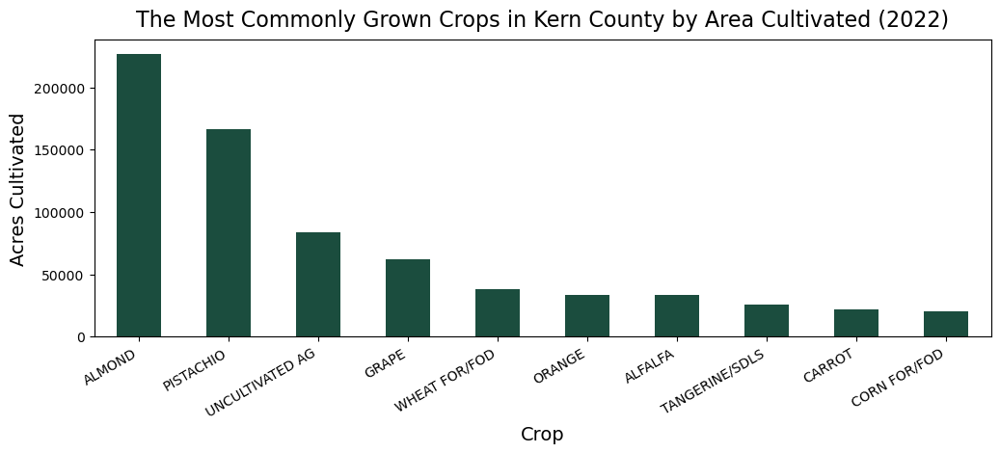

In [75]:
## plotting the 15 most commonly grown crops in the county by area
fig, ax = plt.subplots(figsize=(12,4))

croparea[:10].plot.bar(ax=ax,
                                      x='Crop',
                                      y='Acreage',
                                      legend=False,
                                      color='#1b4d3e'
                                      )
ax.set_xlabel('Crop',fontsize=14)
ax.set_ylabel('Acres Cultivated',fontsize=14) 
ax.set_title("The Most Commonly Grown Crops in Kern County by Area Cultivated (2022)",fontsize=16,pad=10)
plt.xticks(rotation=30, ha='right')
## savefig keeps cropping the exported image so adding this specification
plt.savefig("KernCommonCropsbyArea.jpg", bbox_inches ='tight')

It looks like Kern County is a grower of mostly nuts, grapes, citrus, and grains. I tried searching for what "uncultivated ag" referred to, but still have no found a clear answer. Will return to this later.

Now to try mapping the cropland to see how it's distributed in county.

In [76]:
crops.crs

<Derived Projected CRS: EPSG:2229>
Name: NAD83 / California zone 5 (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - California - counties Kern; Los Angeles; San Bernardino; San Luis Obispo; Santa Barbara; Ventura.
- bounds: (-121.42, 32.76, -114.12, 35.81)
Coordinate Operation:
- name: SPCS83 California zone 5 (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [77]:
## changing projection of crops because it was misaligned before
crops = crops.to_crs("EPSG:4326")

<AxesSubplot: >

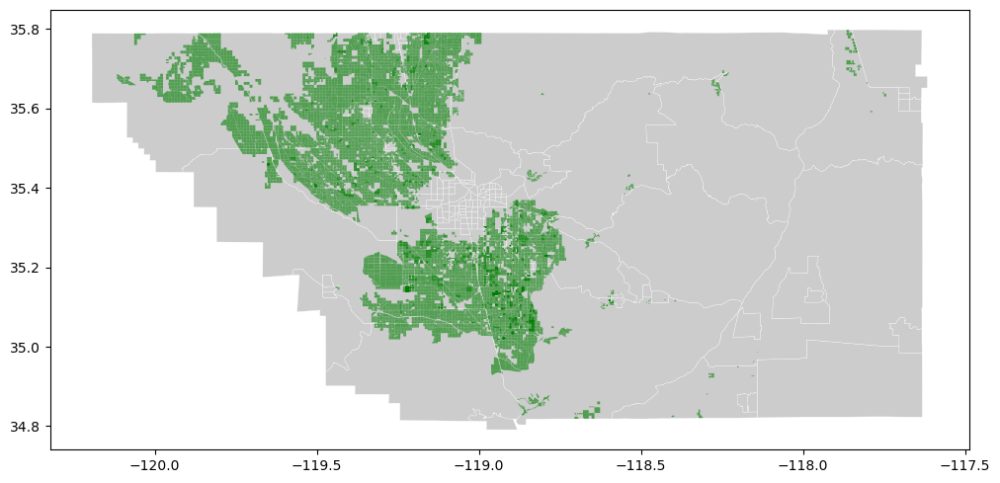

In [78]:
## does it align with the other gdfs?
fig,ax = plt.subplots(figsize=(12,10))
Kern_env.plot(ax=ax,facecolor='#ccc',edgecolor='white',lw=0.2)
crops.plot(ax=ax,color='green',markersize=10,marker='o',alpha=0.6)
## kern_wellsgeo.plot(ax=ax,color='red',markersize=20,marker='x',alpha=0.5)

In [79]:
## checking shape pre attempt to merge/assign a census tract to each crop parcel
print(Kern_env.shape)
print(crops.shape)

(151, 15)
(12178, 5)


In [80]:
kern_crop_env = gpd.sjoin(crops, Kern_env,how="left")
kern_crop_env.shape

(12302, 20)

Seems like there are duplicated values -- not sure what's being duplicated. Investigating...

In [81]:
kern_crop_env.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 12302 entries, 0 to 12177
Data columns (total 20 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   Owner        12302 non-null  object  
 1   Crop         12302 non-null  object  
 2   Acres        12302 non-null  float64 
 3   City         12302 non-null  object  
 4   geometry     12302 non-null  geometry
 5   index_right  12302 non-null  int64   
 6   TotPop19     12302 non-null  int64   
 7   ApproxLoc    12302 non-null  object  
 8   Tract        12302 non-null  object  
 9   FIPS         12302 non-null  object  
 10  Pesticide    12302 non-null  float64 
 11  PesticideP   12302 non-null  float64 
 12  Asthma       12302 non-null  float64 
 13  AsthmaP      12302 non-null  float64 
 14  Cardiovas    12302 non-null  float64 
 15  CardiovasP   12302 non-null  float64 
 16  LowBirtWt    12302 non-null  float64 
 17  LowBirWP     12302 non-null  float64 
 18  Shape_Leng   12302

no missing values...

In [82]:
kern_crop_env.sample(5)

,Owner,Crop,Acres,City,geometry,index_right,TotPop19,ApproxLoc,Tract,FIPS,Pesticide,PesticideP,Asthma,AsthmaP,Cardiovas,CardiovasP,LowBirtWt,LowBirWP,Shape_Leng,Shape_Area
3934,WASCO RANCH LLC,ALMOND,150.0,BAKERSFIELD,"POLYGON ((-119.41124 35.63047, -119.40246 35.6...",1452,2635,Unincorporated Kern County area,6029004500.0,06029004500.0,508.619049,85.758621,29.49,24.065304,14.98,66.151545,5.07,54.272517,230543.991013,2.344339e+09
7757,WONDERFUL NURSERIES LLC,GRAPE,2.0,WASCO,"POLYGON ((-119.39355 35.61673, -119.39241 35.6...",1452,2635,Unincorporated Kern County area,6029004500.0,06029004500.0,508.619049,85.758621,29.49,24.065304,14.98,66.151545,5.07,54.272517,230543.991013,2.344339e+09
10963,ECHEVERRIA FARMS,SORGHUM MILO,125.0,BAKERSFIELD,"POLYGON ((-119.20794 35.14835, -119.20794 35.1...",1545,3358,Unincorporated Kern County area,6029003304.0,06029003304.0,825.469027,88.137931,25.70,17.746760,13.63,58.138086,5.39,61.945086,259228.671777,1.607709e+09
2865,"WESTSIDE FARM MANAGEMENT, INC.",PISTACHIO,72.0,BAKERSFIELD,"POLYGON ((-119.44348 35.53604, -119.43916 35.5...",1452,2635,Unincorporated Kern County area,6029004500.0,06029004500.0,508.619049,85.758621,29.49,24.065304,14.98,66.151545,5.07,54.272517,230543.991013,2.344339e+09
4751,YUROSEK FARMING,PISTACHIO,39.0,BAKERSFIELD,"POLYGON ((-119.12522 35.73265, -119.12070 35.7...",1493,14840,Unincorporated Kern County area,6029004604.0,06029004604.0,3273.939682,95.482759,47.33,52.629611,22.16,93.631605,5.76,70.156531,147649.845976,5.432491e+08


The "city" and the approximate locations for individual parcels don't seem aligned... checking to see if sum of acres in the original crop gdf match the sum of the acres for the parcels assigned to each census tract in the merge.

In [83]:
## table with sum of crop acres per unique tract
crop_count = kern_crop_env.groupby('Tract')['Acres'].sum().reset_index(name='Acreage')
crop_count.head(10)

,Tract,Acreage
0,6029000101.0,152.30
1,6029000503.0,587.71
2,6029001000.0,5750.21
3,6029002400.0,4552.39
4,6029003202.0,1765.39
5,6029003204.0,67556.20
6,6029003206.0,6584.46
7,6029003304.0,95450.04
8,6029003306.0,23286.79
9,6029003500.0,62.00


In [84]:
kern_crop_env = Kern_env.merge(crop_count, how='left', on='Tract')
kern_crop_env.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 151 entries, 0 to 150
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   TotPop19    151 non-null    int64   
 1   ApproxLoc   151 non-null    object  
 2   Tract       151 non-null    object  
 3   FIPS        151 non-null    object  
 4   Pesticide   151 non-null    float64 
 5   PesticideP  151 non-null    float64 
 6   Asthma      151 non-null    float64 
 7   AsthmaP     151 non-null    float64 
 8   Cardiovas   151 non-null    float64 
 9   CardiovasP  151 non-null    float64 
 10  LowBirtWt   151 non-null    float64 
 11  LowBirWP    151 non-null    float64 
 12  Shape_Leng  151 non-null    float64 
 13  Shape_Area  151 non-null    float64 
 14  geometry    151 non-null    geometry
 15  Acreage     47 non-null     float64 
dtypes: float64(11), geometry(1), int64(1), object(3)
memory usage: 20.1+ KB


In [85]:
kern_crop_env.sample(10)

,TotPop19,ApproxLoc,Tract,FIPS,Pesticide,PesticideP,Asthma,AsthmaP,Cardiovas,CardiovasP,LowBirtWt,LowBirWP,Shape_Leng,Shape_Area,geometry,Acreage
119,11403,Bakersfield,6029000910.0,06029000910.0,0.825969,41.448276,67.06,76.233799,15.85,70.737787,3.88,23.915833,30687.743743,3.832986e+07,"POLYGON ((-118.92733 35.44632, -118.92374 35.4...",NaN
100,4038,Bakersfield,6029002814.0,06029002814.0,0.000000,0.000000,81.79,86.453141,17.62,79.150050,6.03,75.763408,5122.914562,1.432167e+06,"POLYGON ((-119.05569 35.33233, -119.05812 35.3...",NaN
36,9530,Delano,6029004800.0,06029004800.0,1.043819,43.241379,49.02,55.396311,23.05,95.264207,5.12,55.606877,11714.008282,4.682131e+06,"POLYGON ((-119.24275 35.74688, -119.25840 35.7...",NaN
120,2936,East Bakersfield,6029001201.0,06029001201.0,0.000000,0.000000,105.79,94.204885,18.21,81.393320,7.84,95.830126,4365.287241,1.089251e+06,"POLYGON ((-118.96747 35.39171, -118.96744 35.3...",NaN
37,9516,Unincorporated Kern County area,6029004000.0,06029004000.0,3359.275237,95.620690,45.40,49.426720,17.07,76.520439,4.42,36.412625,35846.912075,3.329043e+07,"POLYGON ((-119.24244 35.51574, -119.24079 35.5...",6840.29
71,3803,Potomac Park,6029002302.0,06029002302.0,0.000000,0.000000,84.72,87.562313,23.51,95.987039,4.18,30.844239,6301.999482,2.390846e+06,"POLYGON ((-118.98462 35.35231, -118.98530 35.3...",NaN
140,3713,Olde Stockdale,6029002807.0,06029002807.0,0.000000,0.000000,81.79,86.453141,17.62,79.150050,4.26,32.755966,7226.657834,3.140972e+06,"POLYGON ((-119.07448 35.33765, -119.07447 35.3...",NaN
3,3739,Bakersfield,6029001700.0,06029001700.0,0.000000,0.000000,155.81,99.165005,21.11,90.839980,6.83,88.093405,8691.608218,3.686952e+06,"POLYGON ((-119.02470 35.38257, -119.02468 35.3...",NaN
54,4084,Rexland Acres,6029003103.0,06029003103.0,2.536369,49.241379,84.72,87.562313,23.51,95.987039,6.02,75.558122,9654.998328,4.844102e+06,"POLYGON ((-118.99424 35.32495, -118.99424 35.3...",NaN
149,5322,Oildale,6029000300.0,06029000300.0,0.000000,0.000000,75.37,82.352941,20.48,88.995513,5.65,67.924044,7827.806454,1.519610e+06,"POLYGON ((-119.01279 35.41535, -119.01274 35.4...",NaN


In [86]:
## Seeing some 'NaN' - probably where there are no crops grown
## changing values for tracts with no wells to 0
kern_crop_env['Acreage'] = kern_crop_env['Acreage'].fillna(0)

In [87]:
kern_crop_env.sample(10)

,TotPop19,ApproxLoc,Tract,FIPS,Pesticide,PesticideP,Asthma,AsthmaP,Cardiovas,CardiovasP,LowBirtWt,LowBirWP,Shape_Leng,Shape_Area,geometry,Acreage
126,10772,Bakersfield,6029002301.0,06029002301.0,1.336953,44.620690,84.71,87.500000,23.51,95.987039,6.18,78.650244,12598.101095,6.681875e+06,"POLYGON ((-118.91424 35.35830, -118.91418 35.3...",0.00
134,3437,Bakersfield,6029002811.0,06029002811.0,0.000000,0.000000,43.63,47.071286,15.19,67.485045,4.17,30.587632,8807.102158,3.803155e+06,"POLYGON ((-119.11438 35.35138, -119.11422 35.3...",0.00
35,4977,Unincorporated Kern County area,6029000504.0,06029000504.0,0.000000,0.000000,75.37,82.352941,20.48,88.995513,5.86,72.324865,9671.978085,3.281647e+06,"POLYGON ((-119.06822 35.42695, -119.06365 35.4...",0.00
90,7061,Delano,6029005004.0,06029005004.0,0.000000,0.000000,49.02,55.396311,23.05,95.264207,6.34,81.216320,7667.044482,2.806169e+06,"POLYGON ((-119.24612 35.76140, -119.24949 35.7...",17.00
69,5221,Bakersfield,6029003112.0,06029003112.0,0.000000,0.000000,68.78,77.554835,15.93,71.099202,5.27,59.237875,6967.189153,3.017508e+06,"POLYGON ((-119.03896 35.31021, -119.05124 35.3...",0.00
52,4782,Bakersfield,6029002819.0,06029002819.0,0.000000,0.000000,81.79,86.453141,17.62,79.150050,3.76,21.259944,5651.033315,1.652154e+06,"POLYGON ((-119.07445 35.31820, -119.09215 35.3...",0.00
39,8331,Bakersfield,6029000503.0,06029000503.0,96.343655,76.724138,26.79,19.678465,10.22,31.679960,2.78,6.787272,15960.693386,1.036072e+07,"POLYGON ((-119.06771 35.42707, -119.06418 35.4...",587.71
129,2721,Hillcrest,6029000905.0,06029000905.0,0.000000,0.000000,74.17,81.455633,17.38,77.941176,5.31,60.059020,4770.203565,1.282365e+06,"POLYGON ((-118.96481 35.37583, -118.96747 35.3...",0.00
138,8427,Unincorporated Kern County area,6029006202.0,06029006202.0,15069.398770,98.965517,42.92,46.049352,17.84,80.097208,3.37,14.010778,127722.202584,3.785732e+08,"POLYGON ((-118.75269 35.29235, -118.75252 35.2...",99948.74
79,2231,Delano,6029004603.0,06029004603.0,2.492562,49.103448,49.02,55.396311,23.05,95.264207,-999.00,-999.000000,6479.444987,1.958416e+06,"POLYGON ((-119.32097 35.77580, -119.32110 35.7...",0.00


In [88]:
kern_crop_env['Acreage'].info()

<class 'pandas.core.series.Series'>
Int64Index: 151 entries, 0 to 150
Series name: Acreage
Non-Null Count  Dtype  
--------------  -----  
151 non-null    float64
dtypes: float64(1)
memory usage: 2.4 KB


In [89]:
## changing dtype of "Acreage" in merged df it can be summed
kern_crop_env['Acreage'] = kern_crop_env['Acreage'].astype(int)
kern_crop_env['Acreage'].info()

<class 'pandas.core.series.Series'>
Int64Index: 151 entries, 0 to 150
Series name: Acreage
Non-Null Count  Dtype
--------------  -----
151 non-null    int64
dtypes: int64(1)
memory usage: 2.4 KB


In [90]:
## changing dtype of "Acres" in crop df so it can be summed
crops['Acres'] = crops['Acres'].astype(int)
crops['Acres'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 12178 entries, 0 to 12177
Series name: Acres
Non-Null Count  Dtype
--------------  -----
12178 non-null  int64
dtypes: int64(1)
memory usage: 95.3 KB


In [91]:
print(kern_crop_env['Acreage'].sum())
print(crops['Acres'].sum()) ### seems to be mismatch/duplications

908948
896792


More acreage in the new gdf than the original crop gdf. Maybe parcels are being assigned to multiple census tracts if a parcel is split between more than one? Will need to find a different way to assign parcels to census tracts, if at all. Might require taking apart acre polygons/calculating parcel area split between tracts? How to do this? Returning to this later...

## Mapping Oil & Gas Well Locations and Cropland in Kern County

Just going to overlay oil and gas well locations over the cropland in Kern County to get a preliminary sense of how it all lays out.

In [92]:
## checking projection
crops.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [93]:
## changing projection
crops_mercator = crops.to_crs(3857)

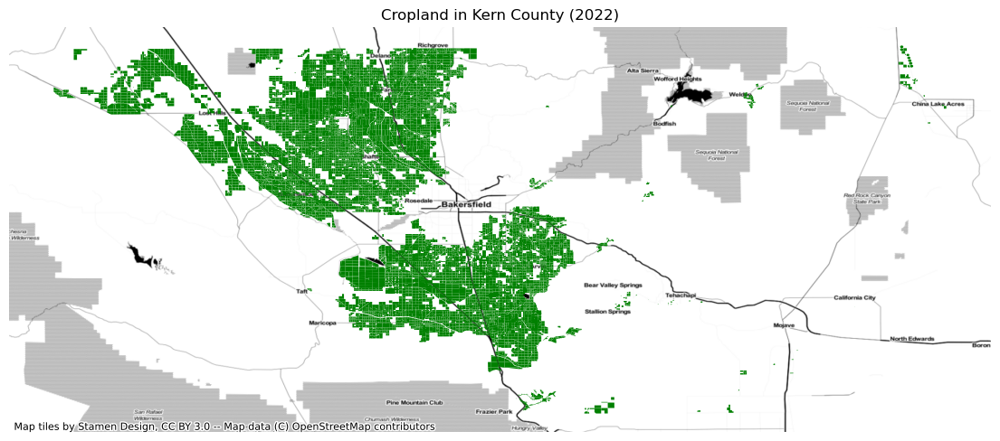

In [94]:
## map layer based on land used to grow crops
fig, ax = plt.subplots(figsize=(14,12))

crops.plot(ax=ax, 
       marker='x',
       markersize=8,
       color='green')

ax.axis('off')
ax.set_title('Cropland in Kern County (2022)')
ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=4326)

In [95]:
## changing projection of oil wells gdf
kern_wellsgeo_mercator= kern_wellsgeo.to_crs(3857)

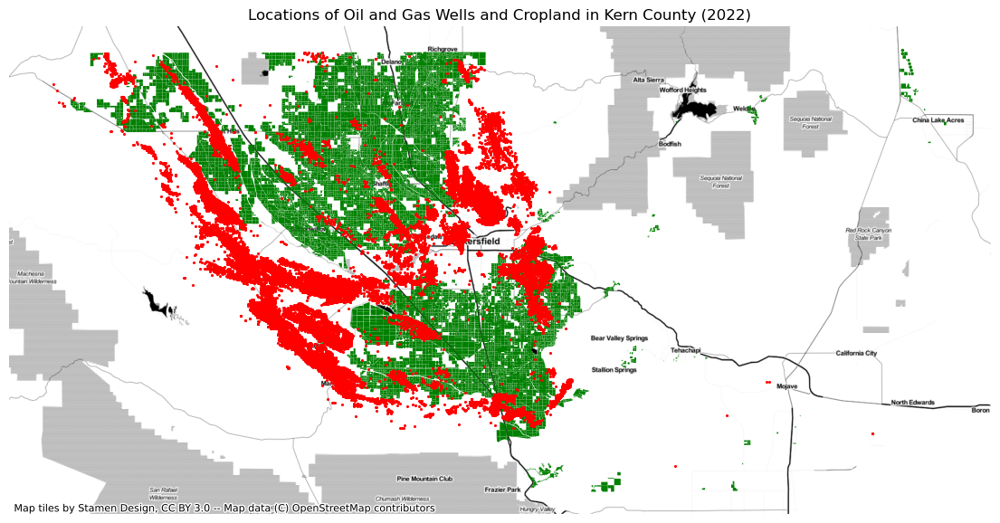

In [96]:
## Adding oil well locations to cropland on the map
fig, ax = plt.subplots(figsize=(14,12))

## crop layer
crops_mercator.plot(ax=ax, 
       marker='x',
       markersize=8,
       color='green')

#OG wells layer
kern_wellsgeo_mercator.plot(ax=ax, 
        marker='.',
        markersize=6,
        color='red')

ax.axis('off')
ax.set_title('Locations of Oil and Gas Wells and Cropland in Kern County (2022)')
ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=3857)

In [97]:
## loading geojson for county boundary lines
countybound = gpd.read_file('Kern_County_Boundary.geojson')

In [98]:
countybound.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   FID            1 non-null      int64   
 1   Kern_KERN_     1 non-null      int64   
 2   PERIMETER      1 non-null      int64   
 3   ACRES          1 non-null      int64   
 4   MUNICI_ID      1 non-null      object  
 5   AREA_SQMI      1 non-null      float64 
 6   ACRES_1        1 non-null      int64   
 7   SHAPE_area     1 non-null      int64   
 8   SHAPE_len      1 non-null      float64 
 9   Shape__Area    1 non-null      float64 
 10  Shape__Length  1 non-null      float64 
 11  geometry       1 non-null      geometry
dtypes: float64(4), geometry(1), int64(6), object(1)
memory usage: 224.0+ bytes


In [99]:
countybound.sample()

,FID,Kern_KERN_,PERIMETER,ACRES,MUNICI_ID,AREA_SQMI,ACRES_1,SHAPE_area,SHAPE_len,Shape__Area,Shape__Length,geometry
0,1,0,0,5223552,COUNTY OF KERN,8161.8,0,227638346939,2.305833e+06,3.185696e+10,862020.384235,"POLYGON ((-120.19438 35.78937, -120.17914 35.7..."


<AxesSubplot: >

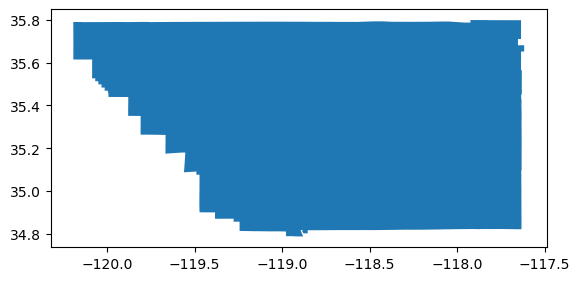

In [100]:
countybound.plot()

In [101]:
## checking projection
countybound.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [102]:
## changing projection
countybound_mercator = countybound.to_crs(3857)

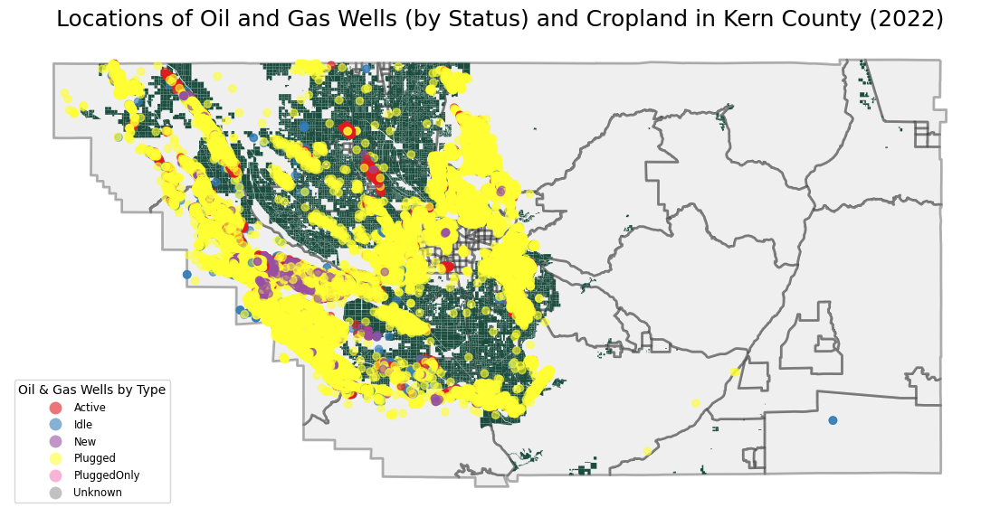

In [103]:
## Adding oil well locations by status to cropland on the map
fig, ax = plt.subplots(figsize=(14,12))

## county line boundary: hex codes (#1b4d3e,#74c365)
## countybound_mercator.plot(ax=ax,facecolor='#ccc',edgecolor='#1b4d3e',lw=3.0,alpha=.3)
## using the CalEnviroScreen data for census tract bounds instead
Kern_env_mercator.plot(ax=ax,facecolor='#ccc',edgecolor='black',lw=2.0,alpha=.3)

## cropland layer: hex codes (#74c365,#679267,#9dc93b)
crops_mercator.plot(ax=ax, 
       marker='.',
       markersize=8,
       color='#1b4d3e')

## OG wells layer
kern_wellsgeo_mercator.plot(ax=ax,
                               column='WellStatus',
                               legend=True,
                               legend_kwds={'loc':'lower left',
                        'bbox_to_anchor':(0, 0), 
                        'markerscale':1, 
                        'title_fontsize':'medium', 
                        'fontsize':'small'},
                               cmap='Set1', 
                               alpha=.6)

ax.axis('off')
ax.get_legend().set_title("Oil & Gas Wells by Type")
ax.set_title('Locations of Oil and Gas Wells (by Status) and Cropland in Kern County (2022)',fontsize=18,pad=10)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=3857)
plt.savefig("Kern_Crops_and_OGwellsall.jpg")

It's difficult to see where the "Active" wells are on this map even though there are over 20K of them, so I'm going to create a subset of oil well data that includes only "Active" wells. THe majority of the wells in this set are "Plugged" and probably just obscuring the "Active" wells on this map.

In [104]:
## Creating a subset of well data with only the "Active" wells
kern_wellsactive_mercator = kern_wellsgeo_mercator[kern_wellsgeo_mercator.WellStatus == 'Active']
kern_wellsactive_mercator.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 23491 entries, 32 to 156271
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Operator    23491 non-null  object  
 1   WellStatus  23491 non-null  object  
 2   WellType    23491 non-null  object  
 3   Latitude    23491 non-null  float64 
 4   Longitude   23491 non-null  float64 
 5   geometry    23491 non-null  geometry
dtypes: float64(2), geometry(1), object(3)
memory usage: 1.3+ MB


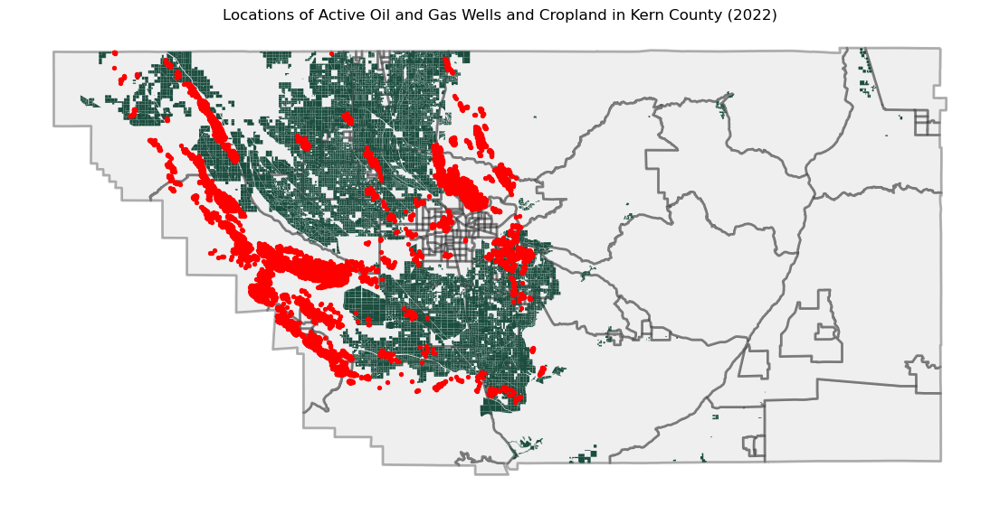

In [105]:
## Adding oil well locations by status to cropland on the map
fig, ax = plt.subplots(figsize=(14,12))

## county line boundary: hex codes (#1b4d3e,#74c365)
## using the CalEnviroScreen data for census tract bounds instead
Kern_env_mercator.plot(ax=ax,facecolor='#ccc',edgecolor='black',lw=2.0,alpha=.3)

## cropland layer: hex codes (#74c365,#679267,#9dc93b)
crops_mercator.plot(ax=ax, 
       marker='.',
       markersize=8,
       color='#1b4d3e')

## OG wells layer
#kern_wellsactive_mercator.plot(ax=ax,
 #                              column='WellStatus',
  #                             legend=False)
                               #legend_kwds={'loc':'lower left',
                        #'bbox_to_anchor':(0, 0), 
                        #'markerscale':1, 
                        #'title_fontsize':'medium', 
                        #'fontsize':'small'},
                         #      cmap='Set1', 
                          #     alpha=.6)
                            
kern_wellsactive_mercator.plot(ax=ax, 
        marker='o',
        markersize=8,
        color='red')

ax.axis('off')
# ax.get_legend().set_title("Oil & Gas Wells by Type")
ax.set_title('Locations of Active Oil and Gas Wells and Cropland in Kern County (2022)')
#ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=3857)
plt.savefig("Kern_Crops_and_OGwellsactive.jpg")

Most of the "Active" wells don't overlap on any cropland, though there are sporadic exceptions.

Now just exploring the distribution/concentration of pesticides in the County to see what that can tell us compared to the crop/oil overlay maps above.

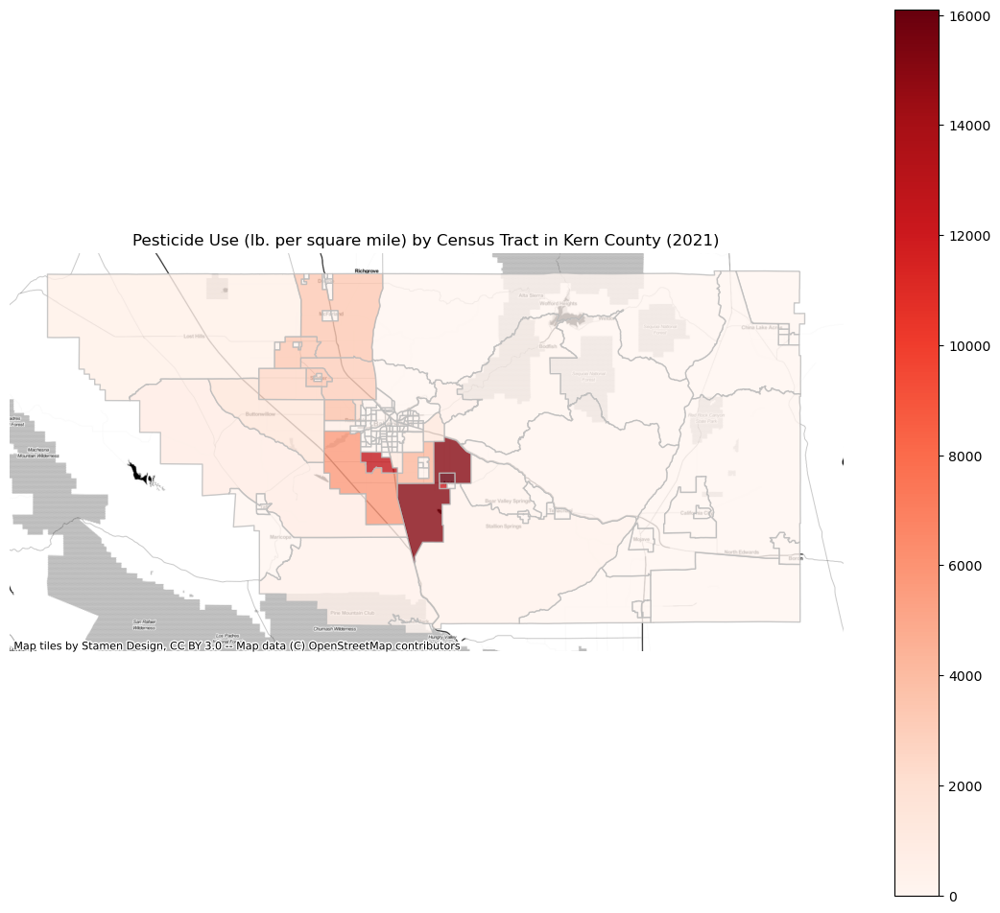

In [106]:
## Mapping total pounds of pesticide used in ag ops/sq mile
fig,ax = plt.subplots(figsize=(14,12))

kern_wells_env_mercator.plot(ax=ax,
                        column='Pesticide',
                        edgecolor='#bbb',  
                        cmap='Reds', 
                        alpha=0.8,
                        legend=True)

ax.axis('off')
ax.set_title('Pesticide Use (lb. per square mile) by Census Tract in Kern County (2021)')
ctx.add_basemap(ax, source=ctx.providers.Stamen.Toner, crs=3857)

Strangely enough again, counterintuitive results. The most highly concentrated usage of pesticides is close to the County center (Bakersfield), where the cropland maps suggest there is nothing/not much being cultivated. This suggests maybe something about the lifecycle of pesticides and how they might be traveling into the soil through the watersheds/waterways? We probably need to compare this with the water quality data in CalEnviroScreen and to do some independent digging about the flow/direction of waterbodies in this County to get a sense of what's happening here. For next week.

## Midterm Group Summary

**Group name**: Environmental Justice In Kern County

**Members**: Yesenia Becerra, Dinah Dominguez, Melody Ng, Nick Stewart-Bloch

**My Contributions**: I explored and mapped cropland data for the county, and explored and mapped oil and gas well data (density in county, relationship to croplands). I also mapped health select outcomes found in the CalEnviroScreen data and put together the interactive map with well locations and select health outcomes that we'll be developing further for the final.